<a href="https://colab.research.google.com/github/codingercat/machine-learning-projects/blob/main/Project_CaseStudy3_StampVerification_Shambhavi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%html
<hr style = "height : 2px; background-color: blue;">
<center> <h1> BASIC CERTIFICATION COURSE IN ARTIFICIAL INTELLIGENCE </h1></center>
<center> <h2> Case Study 3 </h2></center>
<center> <h2> Stamp Verification </h2></center>

<center>  Submitted by : Shambhavi Thakur</center>
<hr style = "height : 2px; background-color: blue;">

**Case Study 3: Stamp Verification**

**Problem Statement:**

An automatic system for stamp segmentation and further verification is needed especially for environments like insurance companies where a huge volume of documents is processed daily. However, detection of a general stamp is not a trivial task as it can have different shapes and colors and, moreover, it can be imprinted with a variable quality and rotation. This dataset was collected to help researchers build such a system.

**Dataset Description:**
This dataset contains 400 scanned document images. The documents are automatically generated invoices that were printed, stamped and scanned with 200 dpi resolution. They include color logos and color texts which makes the evaluation results more realistic. There are stamps of many different shapes and colors including black ones in the data set, sometimes the stamps are overlapped with signatures or a text. In some documents there are multiple stamps or none at all. The ground truth consists of binary images with masks of the stamp strokes which allows for accurate pixel-wise evaluation. This dataset contains the following folders, each with 400 items (one for each image):


*   scans: scans of the stamped genuine documents
*   ground-truth-maps: maps defining the region of the stamp(s)
*   ground-truth-pixel: pixel-level ground truth
*   info: contains text files with the info for each file.

**Aim:**


*   To determine which algorithm best suits to classify the stamps.
*   To give the Analytical Flow of implementation of the algorithm.


In [ ]:
import numpy as np
import pandas as pd
from imageio import imread
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
import skimage
from skimage.transform import *
from skimage.color import *
from skimage.filters import threshold_mean
import cv2
import keras
from keras.models import *
from keras.layers import *
from keras.callbacks import *
from keras.preprocessing.image import *
import matplotlib.pyplot as plt
import seaborn as sns
import glob
pd.set_option('display.max_colwidth', -1)

<ipython-input-2-93e59a2c48a1>:19: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [ ]:
!pip install pillow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
print(os.listdir('/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/'))

['invoice-500-joined.pdf', 'info', 'ground-truth-pixel', 'scans', 'ground-truth-maps']


In [ ]:
#Using glob function store the path of the invoice in a variable
IMG_SIZE=(2302,1632, 3)
scan_files = glob.glob('/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/scans/scans/*.png', recursive=True)
scan_files = sorted(scan_files)
scan_files_train = scan_files[:400]
scan_files_test = scan_files[400:]
truth_files = glob.glob('/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/*.png', recursive=True)
truth_files = sorted(truth_files)

In [ ]:
#Checking the path of the file is saved correctly
print(truth_files)

['/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00001-px.png', '/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00002-px.png', '/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00003-px.png', '/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00004-px.png', '/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00005-px.png', '/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00006-px.png', '/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00007-px.png', '/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00008-px.png', '/content/drive/MyDrive/Stamp-Verification-StaV

In [ ]:
scan_files_train_selected = scan_files_train[363:400]
truth_files_selected = truth_files[363:400]
pd.DataFrame({'scan':scan_files_train_selected, 'truth':truth_files_selected}).tail()

,scan,truth
32,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/scans/scans/stampDS-00396.png,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00396-px.png
33,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/scans/scans/stampDS-00397.png,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00397-px.png
34,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/scans/scans/stampDS-00398.png,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00398-px.png
35,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/scans/scans/stampDS-00399.png,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00399-px.png
36,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/scans/scans/stampDS-00400.png,/content/drive/MyDrive/Stamp-Verification-StaVer-Dataset/ground-truth-pixel/ground-truth-pixel/stampDS-00400-px.png


<ipython-input-9-9cba823b84c1>:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  plt.imshow(imread(scan_files_train_selected[i]))
<ipython-input-9-9cba823b84c1>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  plt.imshow(imread(scan_files_test[i]))


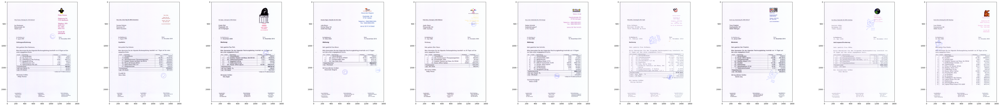

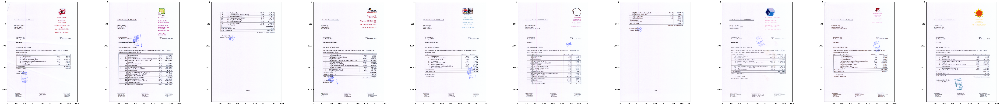

In [ ]:
plt.figure(figsize=(100,10))
for i in range(10):
    plt.subplot(1,10,i+1)
    plt.imshow(imread(scan_files_train_selected[i]))
plt.figure(figsize=(100,10))
for i in range(10):
    plt.subplot(1,10,i+1)
    plt.imshow(imread(scan_files_test[i]))

In [ ]:
###################### BASELINE PERFORMANCE ######################

y = 1-imread(truth_files_selected[0])[:,:,0].flatten()//255
y_pred = np.zeros(y.shape)

print('accuracy_score=', accuracy_score(y,y_pred))
print('log_loss=', log_loss(y,y_pred))

<ipython-input-10-a1e58aa76184>:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  y = 1-imread(truth_files_selected[0])[:,:,0].flatten()//255


accuracy_score= 0.9995630431218232
log_loss= 0.015749522262993556


<ipython-input-11-8e3aab9b1a31>:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  y = 1-imread(truth_files_selected[0])[:,:,0].astype(np.uint8)//255
<ipython-input-11-8e3aab9b1a31>:12: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  x = imread(scan_files_train_selected[0])


CLASS_WEIGHTS[bg,text,stamp]= [1.03921227e+00 2.68127198e+01 4.57711069e+03]


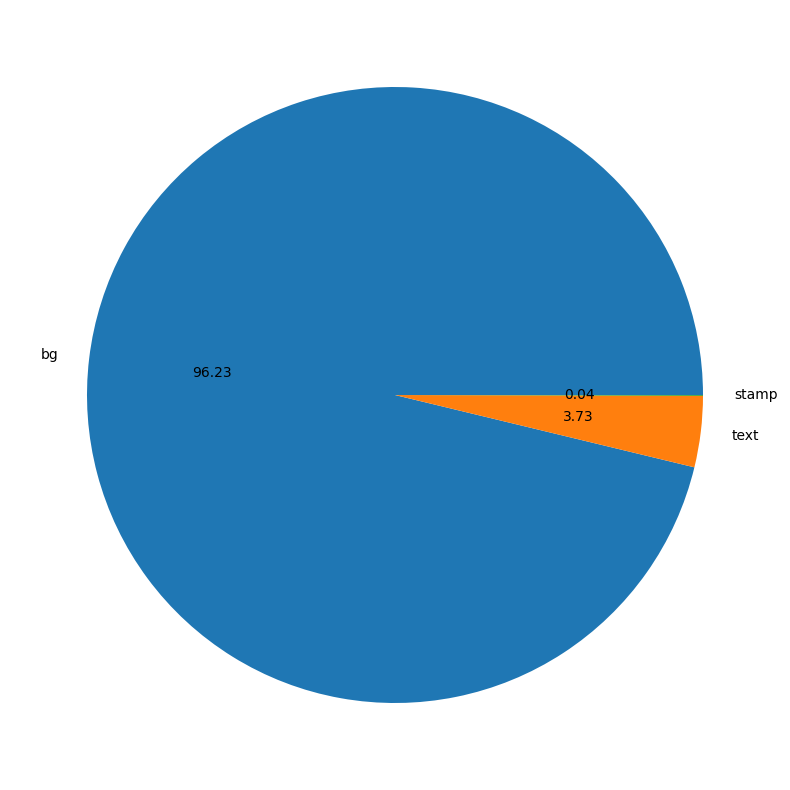

In [ ]:
def calc_sample_weight(label, image):
    image = rgb2gray(image)
    around_texts = cv2.dilate((image < 0.5).astype(np.uint8) | label, np.ones((2,2)))
    combined = around_texts + label
    class_counts = np.unique(combined, return_counts=True)[1]
    class_weight = np.sum(class_counts)/class_counts * np.array([1,1,2])[:len(class_counts)]
    #class_weight = class_weight / np.max(class_weight)
    weights = np.vectorize(lambda x: class_weight[x])(combined).flatten()
    return weights,class_counts,class_weight

y = 1-imread(truth_files_selected[0])[:,:,0].astype(np.uint8)//255
x = imread(scan_files_train_selected[0])
weights,class_counts,class_weight = calc_sample_weight(y, x)
plt.figure(figsize=(10,10))
plt.pie(class_counts, labels=['bg','text','stamp'], autopct='%.2f')
print('CLASS_WEIGHTS[bg,text,stamp]=',class_weight)

In [ ]:
def image_generator(files, randomized=True,labels=None, include_weights=False,batch_size=1, augment=False, gamma_range=(1,1), jitter_range=0):
    img_batch = []
    label_batch = []
    weight_batch = []
    while True:
        indices = range(len(files))
        if randomized:
            indices = np.random.randint(len(files), size=len(files))
        for i in indices:
            if len(img_batch) >= batch_size:
                img_batch = []
                label_batch = []
                weight_batch = []
            img = imread(files[i])
            img = img / 255
            img = cv2.copyMakeBorder(img,
                                     (IMG_SIZE[0]-img.shape[0])//2,
                                     (IMG_SIZE[0]-img.shape[0])-(IMG_SIZE[0]-img.shape[0])//2,
                                     (IMG_SIZE[1]-img.shape[1])//2,
                                     (IMG_SIZE[1]-img.shape[1])-(IMG_SIZE[1]-img.shape[1])//2,
                                     cv2.BORDER_REFLECT)
            label = None
            if labels is not None:
                label = imread(labels[i])
                label = (255-label) / 255
                label = label[:,:,0].astype(np.uint8)
                label = cv2.copyMakeBorder(label,
                                         (IMG_SIZE[0]-label.shape[0])//2,
                                         (IMG_SIZE[0]-label.shape[0])-(IMG_SIZE[0]-label.shape[0])//2,
                                         (IMG_SIZE[1]-label.shape[1])//2,
                                         (IMG_SIZE[1]-label.shape[1])-(IMG_SIZE[1]-label.shape[1])//2,
                                         cv2.BORDER_REFLECT)
            if augment:
                gamma = np.random.uniform(gamma_range[0], gamma_range[1])
                img = img**np.random.uniform(gamma_range[0], gamma_range[1])

                jitter = np.random.uniform(0, jitter_range, (4,2)).astype(np.float32)
                pts1 = np.array(((0,0),(IMG_SIZE[1],0),(0,IMG_SIZE[0]),(IMG_SIZE[1],IMG_SIZE[0]))).astype(np.float32)
                pts2 = pts1 + jitter
                M = cv2.getPerspectiveTransform(pts1,pts2)
                img = cv2.warpPerspective(img,M,(IMG_SIZE[1],IMG_SIZE[0]),borderValue=(1,1,1))
                if labels is not None:
                    label = cv2.warpPerspective(label,M,(IMG_SIZE[1],IMG_SIZE[0]),flags=cv2.INTER_NEAREST, borderValue=0)

            img_batch.append(img)
            if labels is not None:
                if include_weights:
                    weight_batch.append(calc_sample_weight(label,img)[0])
                label_batch.append(label.reshape((IMG_SIZE[1]*IMG_SIZE[0],1)))
            if len(img_batch) >= batch_size:
                if labels is not None:
                    if include_weights:
                        yield np.array(img_batch), np.array(label_batch), np.array(weight_batch)
                    else:
                        yield np.array(img_batch), np.array(label_batch)
                else:
                    yield np.array(img_batch)

<ipython-input-12-25e8962e7421>:14: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imread(files[i])
<ipython-input-12-25e8962e7421>:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  label = imread(labels[i])


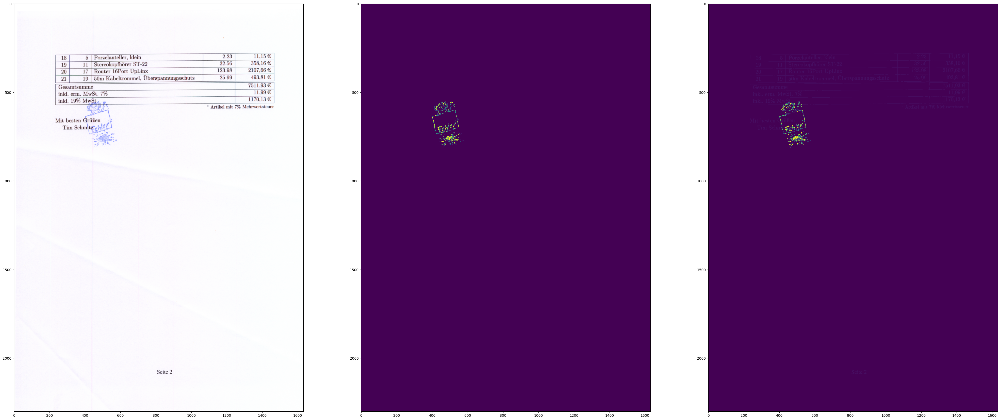

In [ ]:
scans, labels, weights = next(image_generator(scan_files_train_selected, labels=truth_files_selected, include_weights=True, batch_size=1, augment=True, gamma_range=(0.8,0.8), jitter_range=50))

plt.figure(figsize=(50,50))
plt.subplot(1,3,1)
plt.imshow(scans[0]);
plt.subplot(1,3,2)
plt.imshow(labels[0].reshape((IMG_SIZE[0],IMG_SIZE[1])));
plt.subplot(1,3,3)
plt.imshow(weights[0].reshape((IMG_SIZE[0],IMG_SIZE[1])));

**Create the model**

The model consists of convolution blocks. There's a fully connected layer that is activated by a relu activation function.

In [ ]:
def make_model():
    inp = Input(IMG_SIZE)
    x = ZeroPadding2D(((1,1),(16,16)))(inp)
    skips=[]
    for n in [9,12,12]:
        skips.append(x)
        x = Conv2D(n, kernel_size=3,strides=2,activation='relu',padding='same')(x)
        x = BatchNormalization()(x)
    for n in [9,12]:
        x = UpSampling2D(size=2)(x)
        x = concatenate([x, skips.pop()])
        x = Conv2DTranspose(n, kernel_size=3,strides=1,activation='relu',padding='same')(x)
        x = BatchNormalization()(x)
    x = UpSampling2D(size=2)(x)
    x = concatenate([x, skips.pop()])
    x = Conv2DTranspose(1, kernel_size=3,strides=1,activation='sigmoid',padding='same')(x)
    x = Cropping2D(((1,1),(16,16)))(x)
    x = Reshape((IMG_SIZE[0]*IMG_SIZE[1],1,))(x)
    return Model(inp, x)

**Compile the model and checking the model summary**

In [ ]:
model = make_model()
model.compile(optimizer='adam',loss='binary_crossentropy', metrics=['acc'], sample_weight_mode="temporal")
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 2302, 1632,  0           []                               
                                 3)]                                                              
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 2304, 1664,   0          ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 1152, 832, 9  252         ['zero_padding2d[0][0]']         
                                )                                                             

**Train the model**

In [ ]:
!rm *.hdf5

batch_size=1
epochs= 30
checkpoint_period=30
model.fit_generator(image_generator(scan_files_train_selected, labels=truth_files_selected, include_weights=True, batch_size=1, augment=True, gamma_range=(0.8,1.25), jitter_range=50),
                    steps_per_epoch=len(scan_files_train_selected)//batch_size,
                    validation_data=image_generator(scan_files_train_selected, labels=truth_files_selected, include_weights=True, batch_size=1, augment=True, gamma_range=(0.8,1.25), jitter_range=50),
                    validation_steps=3,
                    max_queue_size=1,
                    epochs=epochs,
                    callbacks=[ModelCheckpoint('./stamp.weights.{epoch:04d}.hdf5', period=checkpoint_period, save_weights_only=True)],
                    verbose=1)

rm: cannot remove '*.hdf5': No such file or directory


<ipython-input-16-6496a6a3a47c>:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(image_generator(scan_files_train_selected, labels=truth_files_selected, include_weights=True, batch_size=1, augment=True, gamma_range=(0.8,1.25), jitter_range=50),
<ipython-input-12-25e8962e7421>:14: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imread(files[i])
<ipython-input-12-25e8962e7421>:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  label = imread(labels[i])


Epoch 1/30
37/37 [==============================] - 290s 8s/step - loss: 1.3617 - acc: 0.8661 - val_loss: 2.0536 - val_acc: 0.9989
Epoch 2/30
36/37 [============================>.] - ETA: 6s - loss: 0.5629 - acc: 0.9796 

KeyboardInterrupt: ignored

In [ ]:
steps=len(scan_files_test)
checkpoints = sorted(glob.glob('*.hdf5'))
rows = len(checkpoints)+1

plt.figure(figsize=(steps*10, rows*10))
for i in range(steps):
    plt.subplot(rows,steps,i+1)
    plt.imshow(imread(scan_files_test[i]))
for i, c in enumerate(checkpoints):
    model.load_weights(c)
    predicted = model.predict_generator(image_generator(scan_files_test,randomized=False, labels=None, include_weights=False, batch_size=1, augment=False),
                       steps=steps)
    predicted = np.round(predicted).reshape((steps,IMG_SIZE[0],IMG_SIZE[1]))
    for s in range(steps):
        plt.subplot(rows,steps,i*steps+s+steps+1)
        plt.imshow(predicted[s])

Prediction

In [ ]:
steps=len(scan_files_test)
checkpoints = sorted(glob.glob('*.hdf5'))
rows = len(checkpoints)+1

plt.figure(figsize=(steps*10, rows*10))
for i in range(steps):
    plt.subplot(rows,steps,i+1)
    plt.imshow(imread(scan_files_test[i]))
for i, c in enumerate(checkpoints):
    model.load_weights(c)
    predicted = model.predict_generator(image_generator(scan_files_test,randomized=False, labels=None, include_weights=False, batch_size=1, augment=False),
                       steps=steps)
    predicted = np.round(predicted).reshape((steps,IMG_SIZE[0],IMG_SIZE[1]))
    for s in range(steps):
        plt.subplot(rows,steps,i*steps+s+steps+1)
        plt.imshow(predicted[s])